In [107]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import os
import matplotlib.pyplot as plt

train_data_dir = str(os.getcwd())+'/images/'
test_data_dir = str(os.getcwd())+'/test/'

# Set the parameters
input_shape = (224, 224,3)
num_classes = 10
batch_size = 50
epochs = 25
validation_split = 0.2  # 20% of the training dataset will be used for validation

In [112]:
# import tensorflow as tf
# from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Define the main directory containing the class subdirectories
# main_dir = 'path_to_main_directory'

# Create an ImageDataGenerator
datagen = ImageDataGenerator(rescale=1./255, validation_split=0.2)

# Specify the image dimensions and batch size
image_height, image_width = 224, 224
batch_size = 32

# Create the training image dataset
train_dataset = datagen.flow_from_directory(
    train_data_dir,
    target_size=(image_height, image_width),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True,
    subset='training'
)

# Create the validation image dataset
val_dataset = datagen.flow_from_directory(
    test_data_dir,
    target_size=(image_height, image_width),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True,
    subset='validation'
)


Found 1591 images belonging to 10 classes.
Found 60 images belonging to 10 classes.


In [113]:
# Define and compile the model (same as before)

# Define the model architecture
model = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=input_shape),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D((2, 2)),
    tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D((2, 2)),
    tf.keras.layers.Conv2D(128, (3, 3), activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D((2, 2)),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.BatchNormalization(),
#     tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(num_classes, activation='softmax')
])

In [114]:
# Compile the model
model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

In [115]:
# Train the model
history=model.fit(
    train_dataset,
    steps_per_epoch=train_dataset.samples // batch_size,
    epochs=epochs,
    validation_data=val_dataset,
    validation_steps=val_dataset.samples // batch_size
)

Epoch 1/25


2023-07-18 05:28:34.263244: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


49/49 [==============================] - ETA: 0s - loss: 1.9876 - accuracy: 0.4080

2023-07-18 05:30:23.874603: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


49/49 [==============================] - 111s 2s/step - loss: 1.9876 - accuracy: 0.4080 - val_loss: 4.4414 - val_accuracy: 0.0938
Epoch 2/25
49/49 [==============================] - 108s 2s/step - loss: 1.1483 - accuracy: 0.6004 - val_loss: 4.4848 - val_accuracy: 0.1250
Epoch 3/25
49/49 [==============================] - 108s 2s/step - loss: 0.8132 - accuracy: 0.7530 - val_loss: 4.6535 - val_accuracy: 0.0625
Epoch 4/25
49/49 [==============================] - 108s 2s/step - loss: 0.4812 - accuracy: 0.8647 - val_loss: 4.4491 - val_accuracy: 0.1562
Epoch 5/25
49/49 [==============================] - 109s 2s/step - loss: 0.2303 - accuracy: 0.9513 - val_loss: 3.1885 - val_accuracy: 0.2812
Epoch 6/25
49/49 [==============================] - 109s 2s/step - loss: 0.1108 - accuracy: 0.9788 - val_loss: 3.4708 - val_accuracy: 0.3125
Epoch 7/25
49/49 [==============================] - 109s 2s/step - loss: 0.0524 - accuracy: 0.9955 - val_loss: 3.4072 - val_accuracy: 0.2812
Epoch 8/25
49/49 [======

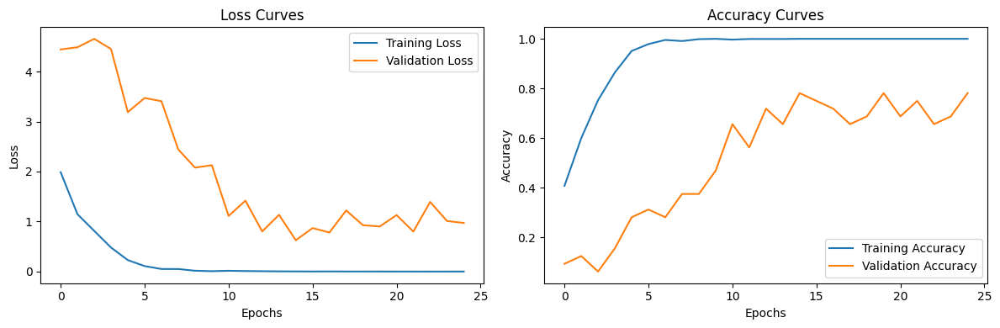

In [116]:
# Plot the loss and accuracy curves
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Loss Curves')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Accuracy Curves')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

In [117]:
model.save('painting_classification_model.h5')

In [118]:
# import matplotlib.pyplot as plt

test_datagen = ImageDataGenerator(rescale=1.0/255)


# Load the test dataset using the flow_from_directory method
test_generator = test_datagen.flow_from_directory(
    test_data_dir,
    target_size=input_shape[:2],
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False  # Ensure test data is not shuffled
)

# # Calculate the test loss for each batch
# test_loss_values = []
# num_batches = len(test_generator)
# for i in range(num_batches):
#     batch_images, batch_labels = test_generator[i]
#     batch_loss = model.evaluate(batch_images, batch_labels, verbose=0)[0]
#     test_loss_values.append(batch_loss)

# # Plot the test loss curve
# epochs = range(1, num_batches + 1)

# plt.plot(epochs, test_loss_values, 'g', label='Test Loss')
# plt.title('Test Loss Curve')
# plt.xlabel('Batches')
# plt.ylabel('Loss')
# plt.legend()
# plt.show()

# Evaluate the model on the test data
test_loss, test_accuracy = model.evaluate(test_generator)

print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)





# import matplotlib.pyplot as plt

# # # Calculate the test loss and accuracy for each epoch
# # test_loss_values = []
# # test_accuracy_values = []
# # num_epochs = len(history.history['val_loss'])
# # for epoch in range(num_epochs):
# #     batch_loss = []
# #     batch_accuracy = []
# #     for i in range(len(test_generator)):
# #         batch_images, batch_labels = test_generator[i]
# #         batch_loss_i, batch_accuracy_i = model.evaluate(batch_images, batch_labels, verbose=0)
# #         batch_loss.append(batch_loss_i)
# #         batch_accuracy.append(batch_accuracy_i)
# #     test_loss_values.append(sum(batch_loss) / len(batch_loss))
# #     test_accuracy_values.append(sum(batch_accuracy) / len(batch_accuracy))

# # # Plot the test loss and accuracy curves
# # epochs = range(1, num_epochs + 1)

# # plt.figure(figsize=(12, 4))

# # # Plot the test loss curve
# # plt.subplot(1, 2, 1)
# # plt.plot(epochs, test_loss_values, 'g', label='Test Loss')
# # plt.title('Test Loss Curve')
# # plt.xlabel('Epochs')
# # plt.ylabel('Loss')
# # plt.legend()

# # # Plot the test accuracy curve
# # plt.subplot(1, 2, 2)
# # plt.plot(epochs, test_accuracy_values, 'b', label='Test Accuracy')
# # plt.title('Test Accuracy Curve')
# # plt.xlabel('Epochs')
# # plt.ylabel('Accuracy')
# # plt.legend()
# # Calculate the test loss and accuracy for each batch
# # Calculate the test loss and accuracy for each epoch
# # Train the model and collect the history
# # history = model.fit(
# #     train_generator,
# #     steps_per_epoch=train_generator.samples // batch_size,
# #     epochs=10,
# #     validation_data=validation_generator,
# #     validation_steps=validation_generator.samples // batch_size
# # )

# # Calculate the test loss and accuracy for each epoch
# test_loss_values = []
# test_accuracy_values = []
# num_epochs =  len(history.history['loss']) 
# for epoch in range(num_epochs):
#     loss, accuracy = model.evaluate(test_generator, verbose=0)
#     test_loss_values.append(loss)
#     test_accuracy_values.append(accuracy)

# # Plot the loss and accuracy curves
# plt.figure(figsize=(12, 4))
# plt.subplot(1, 2, 1)
# plt.plot(test_loss_values, label='Testing Loss')
# plt.title('Loss Curves')
# plt.xlabel('Epochs')
# plt.ylabel('Loss')
# plt.legend()

# plt.subplot(1, 2, 2)
# plt.plot(test_accuracy_values, label='Testing Accuracy')
# plt.title('Accuracy Curves')
# plt.xlabel('Epochs')
# plt.ylabel('Accuracy')
# plt.legend()

# # Adjust the layout and display the plots
# plt.tight_layout()
# plt.show()


Found 300 images belonging to 10 classes.


2023-07-18 06:18:53.390756: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


10/10 [==============================] - 6s 610ms/step - loss: 0.7214 - accuracy: 0.8200
Test Loss: 0.7213658690452576
Test Accuracy: 0.8199999928474426


In [119]:
from tensorflow.keras.models import Model
feature_extractor_model = Model(inputs=model.input, outputs=model.layers[-3].output)

In [120]:
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.vgg16 import preprocess_input
import numpy as np

all_images = []
all_labels = []

def load_and_preprocess_image(image_path):
    img = image.load_img(image_path, target_size=(input_shape[0], input_shape[1]))
    img = image.img_to_array(img)
    img = np.expand_dims(img, axis=0)
    img = preprocess_input(img)
    return img

parent_dir = str(os.getcwd())+'/images/'
for class_index, class_name in enumerate(os.listdir(parent_dir)):
    class_dir = os.path.join(parent_dir, class_name)
    for file_name in os.listdir(class_dir):
        img_path = os.path.join(class_dir, file_name)
        img = load_and_preprocess_image(img_path)
        all_images.append(img)
        all_labels.append(class_index)

all_images = np.concatenate(all_images, axis=0)

In [121]:
all_images.shape

(1987, 224, 224, 3)

In [138]:
all_features = feature_extractor_model.predict(all_images)
# , batch_size=batch_size

2023-07-18 06:37:00.632091: W tensorflow/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 1196396544 exceeds 10% of free system memory.


63/63 [==============================] - 36s 563ms/step


In [139]:
#Using KNN to find the nearest images
from sklearn.neighbors import NearestNeighbors

knn = NearestNeighbors(n_neighbors=10)
knn.fit(all_features)

NearestNeighbors(n_neighbors=10)

1/1 [==============================] - 0s 35ms/step


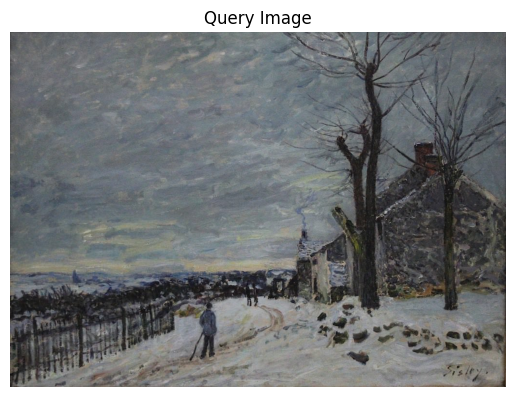

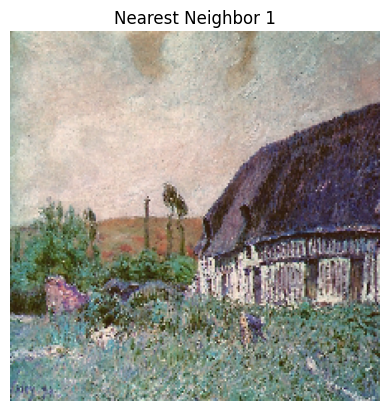

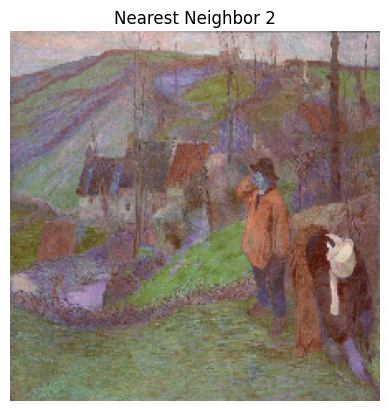

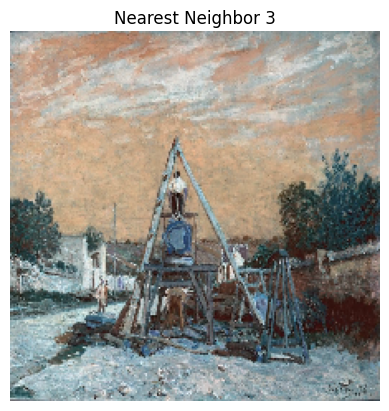

In [140]:
# Select an image for which you want to find nearest neighbors
image_path = '/home/sanith/DeepLearning/hw6/images/Alfred_Sisley/Alfred_Sisley_1.jpg'
query_image = load_and_preprocess_image(image_path)
query_feature = feature_extractor_model.predict(query_image)

# Perform nearest neighbor search for the query image
distances, indices = knn.kneighbors(query_feature)

# Display the query image
plt.figure()
plt.imshow(image.load_img(image_path))
plt.title('Query Image')
plt.axis('off')
plt.show()

# Display the nearest neighbor images
for i, neighbor_index in enumerate(indices[0][1:4]):
    neighbor_image = all_images[neighbor_index]
    plt.figure()
    plt.imshow(image.array_to_img(neighbor_image))
    plt.title('Nearest Neighbor {}'.format(i+1))
    plt.axis('off')
    plt.show()

In [141]:
all_features.shape

(1987, 128)

1/1 [==============================] - 0s 34ms/step


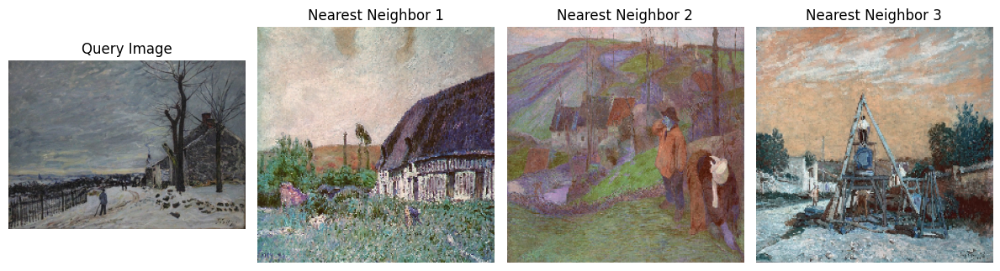

1/1 [==============================] - 0s 81ms/step


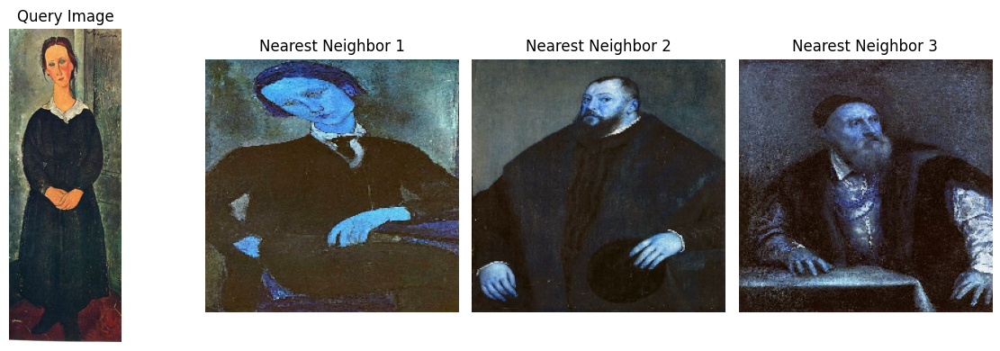

1/1 [==============================] - 0s 34ms/step


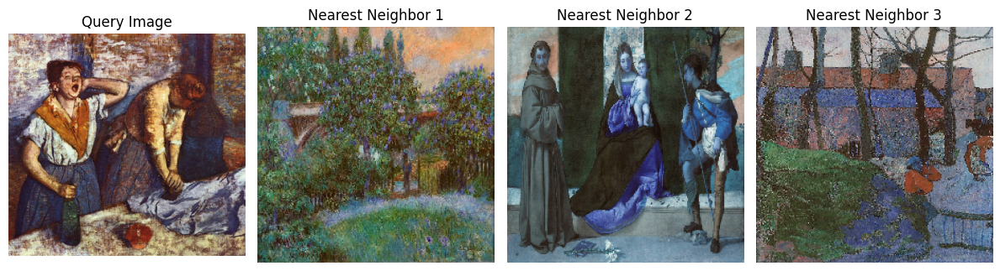

1/1 [==============================] - 0s 36ms/step


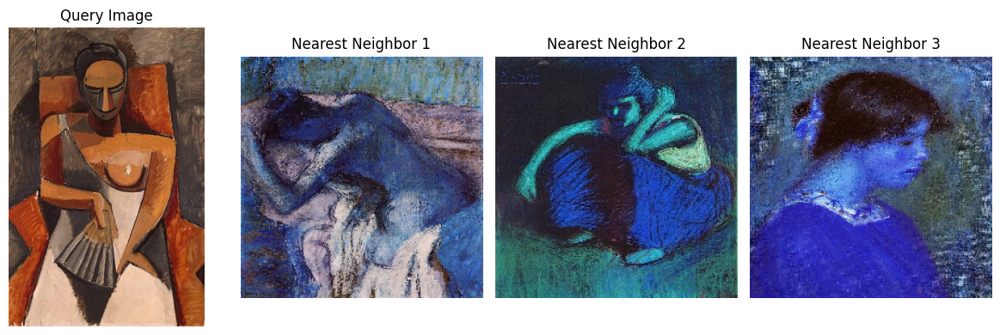

1/1 [==============================] - 0s 38ms/step


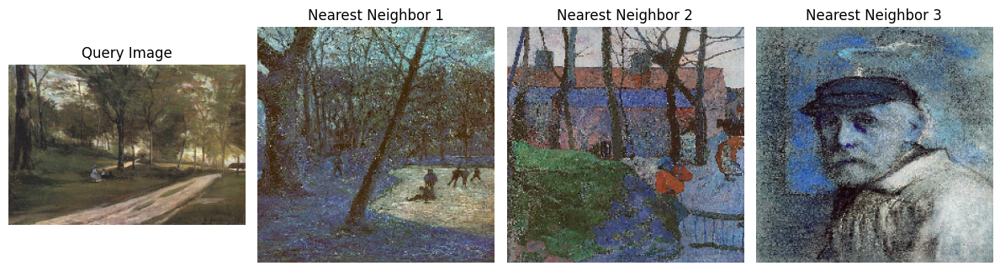

1/1 [==============================] - 0s 38ms/step


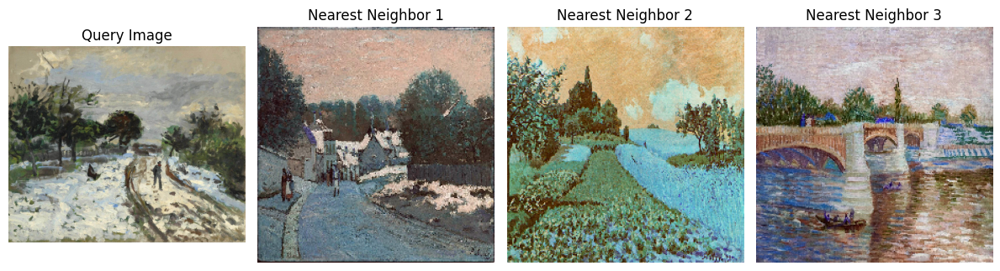

1/1 [==============================] - 0s 43ms/step


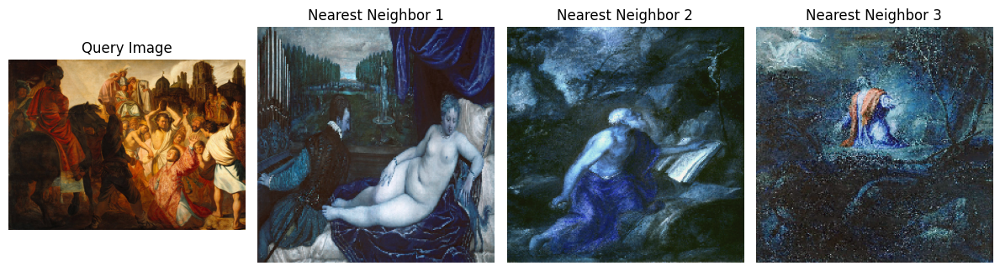

1/1 [==============================] - 0s 34ms/step


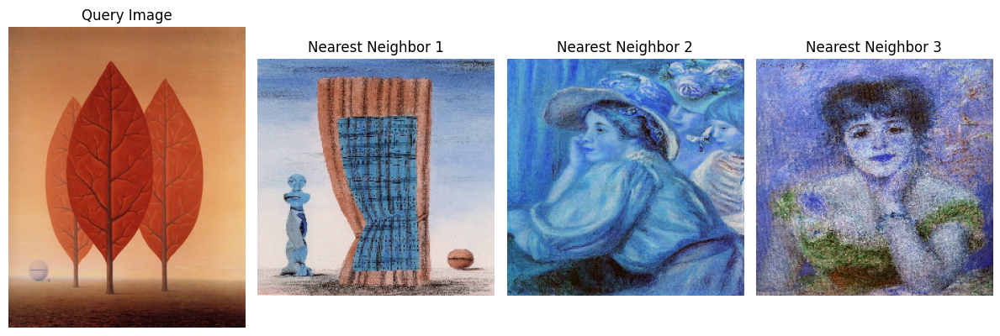

1/1 [==============================] - 0s 60ms/step


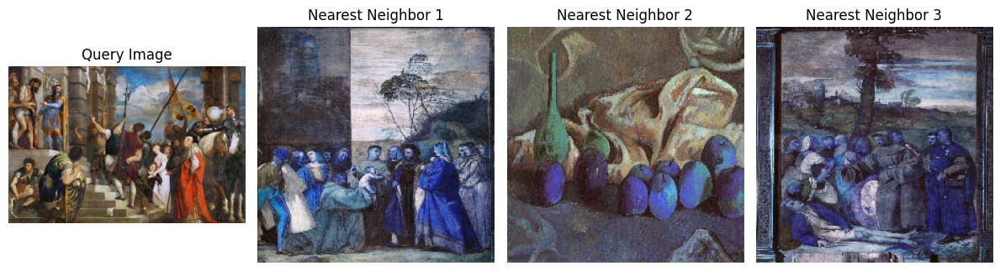

1/1 [==============================] - 0s 37ms/step


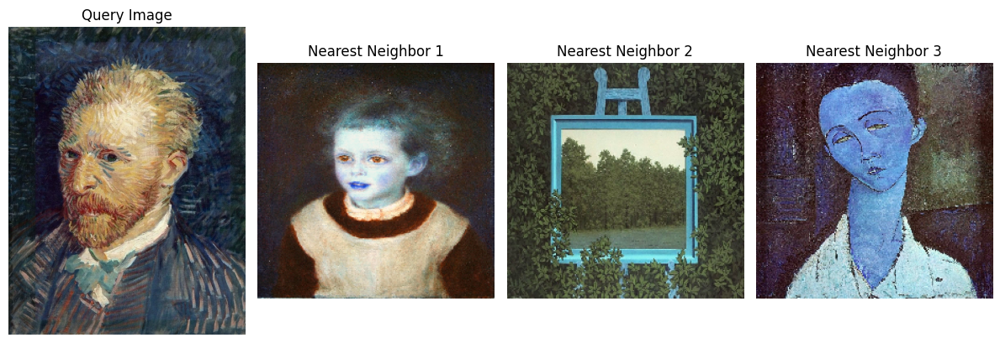

In [142]:
import matplotlib.pyplot as plt
from PIL import Image

# List of image paths
image_paths = [
    '/home/sanith/DeepLearning/hw6/images/Alfred_Sisley/Alfred_Sisley_1.jpg',
    '/home/sanith/DeepLearning/hw6/images/Amedeo_Modigliani/Amedeo_Modigliani_1.jpg',
    '/home/sanith/DeepLearning/hw6/images/Edgar_Degas/Edgar_Degas_1.jpg',
    '/home/sanith/DeepLearning/hw6/images/Pablo_Picasso/Pablo_Picasso_1.jpg',
    '/home/sanith/DeepLearning/hw6/images/Paul_Gauguin/Paul_Gauguin_1.jpg',
    '/home/sanith/DeepLearning/hw6/images/Pierre-Auguste_Renoir/Pierre-Auguste_Renoir_1.jpg',
    '/home/sanith/DeepLearning/hw6/images/Rembrandt/Rembrandt_1.jpg',
    '/home/sanith/DeepLearning/hw6/images/Rene_Magritte/Rene_Magritte_1.jpg',
    '/home/sanith/DeepLearning/hw6/images/Titian/Titian_1.jpg',
    '/home/sanith/DeepLearning/hw6/images/Vincent_van_Gogh/Vincent_van_Gogh_1.jpg'
]

# Number of nearest neighbors to display
num_neighbors = 3
# main_path='/home/sanith/DeepLearning/'
# Iterate over each image path
for image_path in image_paths:
    # Load and preprocess the query image
    query_image = load_and_preprocess_image(image_path)
    query_feature = feature_extractor_model.predict(query_image)

    # Perform nearest neighbor search for the query image
    distances, indices = knn.kneighbors(query_feature)

    # Create a subplot grid for query image and nearest neighbors
    plt.figure(figsize=(12, 4))
    plt.subplot(1, num_neighbors+1, 1)

    # Display the query image
    query_img = Image.open(image_path)
    plt.imshow(query_img)
    plt.title('Query Image')
    plt.axis('off')

    # Display the nearest neighbor images
    for i, neighbor_index in enumerate(indices[0][1:4]):
        neighbor_image_path = all_images[neighbor_index]
        # neighbor_img = Image.open(neighbor_image_path)

        plt.subplot(1, num_neighbors+1, i+2)
        plt.imshow(image.array_to_img(neighbor_image_path))
        plt.title('Nearest Neighbor {}'.format(i+1))
        plt.axis('off')

    # Adjust spacing between subplots
    plt.tight_layout()
    plt.show()


In [186]:
import tensorflow.compat.v1 as tf2
from tensorboard.plugins import projector
tf2.disable_v2_behavior()

PATH=os.getcwd()

logdir= PATH+'/logs'
summary_writer = tf2.summary.FileWriter(logdir)
embedding_var = tf2.Variable(all_features,name='painting_embedding')

config = projector.ProjectorConfig()
embedding = config.embeddings.add()
embedding.tensor_name = embedding_var.name
embedding.metadata_path = os.path.join(logdir, 'metadata.tsv')
embedding.sprite.image_path = os.path.join(logdir, 'sprite.png')
embedding.sprite.single_image_dim.extend([28,28])
summary_writer = tf2.summary.FileWriter(logdir)
projector.visualize_embeddings(summary_writer,config)

In [187]:
with tf2.compat.v1.Session() as sess:
    sess.run(tf2.compat.v1.global_variables_initializer())
    saver = tf2.compat.v1.train.Saver()
    saver.save(sess, logdir + '/model.ckpt')

In [188]:
np.sqrt(all_features.shape[0])

44.57577817604534

In [189]:
rows = 16
cols = 8
label = ['0','1','2','3','4','5','6','7','8','9']
sprite_dim = int(np.sqrt(all_features.shape[0]))
sprite_image= np.ones((cols * sprite_dim,rows*sprite_dim))
index=0
labels=[]
for i in range(sprite_dim):
    for j in range(sprite_dim):
        
        labels.append(label[int(all_labels[index])])
        
        sprite_image[
        i*cols:(i+1) *cols,
        j*rows:(j+1) * rows
         
        ] = all_features[index].reshape(8,16)*-1+1
        
        index+=1

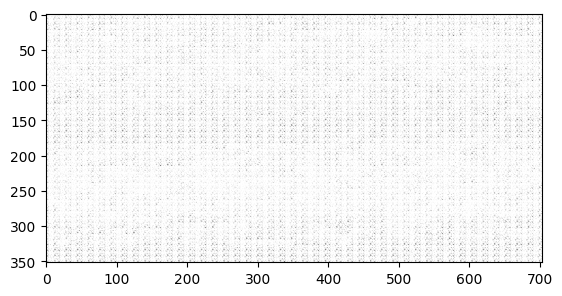

In [190]:
with open(embedding.metadata_path,'w') as meta:
    
    meta.write('Index\tLabel\n')
    for index,label in enumerate(all_labels):
        meta.write('{}\t{}\n'.format(index,label))
plt.imsave(embedding.sprite.image_path,sprite_image,cmap='gray')

plt.imshow(sprite_image,cmap='gray')

plt.show()